<h1>DCGAN REFERENCES


https://arxiv.org/abs/1511.06434

https://stackoverflow.com/questions/51433378/what-does-model-train-do-in-pytorch

https://stackoverflow.com/questions/53975717/pytorch-connection-between-loss-backward-and-optimizer-step

https://towardsdatascience.com/generative-adversarial-networks-gans-a-beginners-guide-f37c9f3b7817

https://mafda.medium.com/gans-conditional-gans-with-cifar10-part-9-8e47373e33b8

https://www.youtube.com/watch?v=Snqb7Usrauw

In [14]:
import torch as T
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import numpy as np
import torchvision
import torchvision.datasets as datasets
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
from torch.utils.tensorboard import SummaryWriter
from sklearn.metrics import roc_auc_score,f1_score

In [15]:
device=T.device("cuda" if T.cuda.is_available() else "cpu")

In [16]:
class PrintLayer(nn.Module):
    def __init__(self):
        super(PrintLayer, self).__init__()
    
    def forward(self, x):
        print(x.shape)
        return x

<h3>Generator

In [17]:
#upsample noise
class Generator(nn.Module):
    #noise
    def __init__(self,z_dim,img_channels,features_g):
        #Input: N(batch)*Noise*1*1
        super(Generator,self).__init__()
        self.gen=nn.Sequential(
            #(input,output,ksize,stride,padding) input 1x1
            self._block(z_dim,features_g*16,4,1,0),
            self._block(features_g*16,features_g*8,4,2,1,), #4x4
            self._block(features_g*8,features_g*4,4,2,1), #8x8
            self._block(features_g*4,features_g*2,4,2,1),#16x16
            nn.ConvTranspose2d(features_g * 2,img_channels,kernel_size=4,stride=2,padding=1,bias = False),
            nn.Tanh(),
            # PrintLayer()
            # PrintLayer()#normalise -1,1
        ) 
    def _block(self,in_channel,out_channel,kernel_size,stride,padding):
        #upscale noise
        return nn.Sequential(
            nn.ConvTranspose2d(
                in_channel,out_channel,kernel_size,stride,padding,bias=False
            ), 
            nn.BatchNorm2d(out_channel),
            nn.ReLU(True),
            # PrintLayer()
        )
    def forward(self,x): #forward propagate
        return self.gen(x)


In [18]:
class Discriminator(nn.Module):
    #img channel is images
    def __init__(self,img_channel,feature_d): #feature d is channels that will change as layers of discriminator are gone though
        super(Discriminator,self).__init__()
        #first layer no batch norm last generator
        #Input:N(batch) * img_channelx64x64
        self.discrim=nn.Sequential(
            #input 64x64
            nn.Conv2d(img_channel,feature_d,kernel_size=4,stride=2,padding=1,bias=False), 
            # nn.BatchNorm2d(feature_d),
            nn.LeakyReLU(0.1, inplace=True),
            # PrintLayer(),

            nn.Conv2d(feature_d,feature_d*2,kernel_size=4,stride=2,padding=1,bias=False), 
            nn.BatchNorm2d(feature_d*2),
            nn.LeakyReLU(0.1, inplace=True),
            # PrintLayer(),

            nn.Conv2d(feature_d*2,feature_d*4,kernel_size=4,stride=2,padding=1,bias=False), 
            nn.BatchNorm2d(feature_d*4),
            nn.LeakyReLU(0.1, inplace=True),
            # PrintLayer(),

            nn.Conv2d(feature_d*4,feature_d*8,kernel_size=4,stride=2,padding=1,bias=False), 
            nn.BatchNorm2d(feature_d*8),
            nn.LeakyReLU(0.1, inplace=True),
            # PrintLayer(),

            # nn.Dropout(0.4),
            nn.Conv2d(feature_d*8,1,kernel_size=4,stride=2,padding=0,bias=False),#fake or real 1x1
            nn.Sigmoid(),
            # PrintLayer()
        )
    def forward(self,x): #forward propagate
        return self.discrim(x)

In [19]:
#improve the stability and quality of the generated images.
def initialize_weights(model):
    #initialise weight using normal distribution, [-1,1], std=0.02 mean=0
    for m in model.modules():
        if isinstance(m,(nn.Conv2d,nn.ConvTranspose2d)):
            nn.init.normal(m.weight.data,0.0,0.02)
        if isinstance(m,nn.BatchNorm2d):
            nn.init.normal(m.weight.data,0.0,0.02)
            # ensure that the activations have zero mean
            nn.init.constant(m.bias,0)


In [20]:

lr=2e-4
batch_size=128

img_channel=3
noise=100
epochs=45
filter_gen=64
filter_discim=64
step=0

In [21]:
transform=transforms.Compose(
    [
        #64 allows the model to learn more complex features and patterns from the data instead of 32
        transforms.Resize(64),
        transforms.ToTensor(),
        transforms.Normalize((0.5 ,0.5,0.5),(0.5,0.5,0.5)) #
    ]
)
dataset=datasets.CIFAR10(root="dataset/",train=True,transform=transform,download=True)
#lodding dataset easily iterate over data in batches, which is more memory efficient and faster than loading entire thing at once.
dataloader=DataLoader(dataset,batch_size=batch_size,shuffle=True,num_workers=2)

Files already downloaded and verified


In [9]:

gen=Generator(noise,img_channel,filter_gen).to(device)
disc=Discriminator(img_channel,filter_discim).to(device)



initialize_weights(gen)
initialize_weights(disc)
optimizer_gen=optim.Adam(gen.parameters(),lr=0.0001,betas=(0.5,0.999))
optimizer_discri=optim.Adam(disc.parameters(),lr=lr,betas=(0.5,0.999))
loss_func=nn.BCELoss() #Binary Cross-Entropy Loss
fixed_noise=T.randn(128,noise,1,1).to(device)
#samp size,noise,spatial dimension
writer_real=SummaryWriter(f"batch64newlogs/real")
writer_fake=SummaryWriter(f"batch64newlogs/fake")
# inform layers such as Dropout and BatchNorm, which are designed to behave differently during training and evaluation.



C:\Users\N8VAN\AppData\Local\Temp\ipykernel_14048\1561114014.py:6: UserWarning: nn.init.normal is now deprecated in favor of nn.init.normal_.
  nn.init.normal(m.weight.data,0.0,0.02)
C:\Users\N8VAN\AppData\Local\Temp\ipykernel_14048\1561114014.py:8: UserWarning: nn.init.normal is now deprecated in favor of nn.init.normal_.
  nn.init.normal(m.weight.data,0.0,0.02)
C:\Users\N8VAN\AppData\Local\Temp\ipykernel_14048\1561114014.py:10: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.
  nn.init.constant(m.bias,0)


In [10]:
gen.train()

Generator(
  (gen): Sequential(
    (0): Sequential(
      (0): ConvTranspose2d(100, 1024, kernel_size=(4, 4), stride=(1, 1), bias=False)
      (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (1): Sequential(
      (0): ConvTranspose2d(1024, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (2): Sequential(
      (0): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (3): Sequential(
      (0): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inpla

In [11]:
disc.train()

Discriminator(
  (discrim): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.1, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.1, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.1, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.1, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(2, 2), bias=False)
    (12): Sigmoid()
  )
)

In [12]:
gen_losses=[]
discrim_losses=[]


Increased batchsize 2/3/2023

In [13]:
for epoch in range(epochs):
    #target labels unneeded as it is supervised
    for batch ,(real,_) in enumerate(dataloader):
        real=real.to(device)
        noise=T.randn(128,100,1,1).to(device) #fake real
        fake=gen(noise)
        # print(fake.shape)
        #Train discriminator max log(D(x)) + log(1 - D(G(z)))
        #true labels given the predictions of the discriminator for real(1st term) and fake(2nd term) data
        #goal: maximise 1st term minimise 2nd term
        disc_real=disc(real).reshape(-1)
        dloss_real=loss_func(disc_real,T.ones_like(disc_real))
        #send all real then fake training discriminator
        disc_fake=disc(fake.detach()).reshape(-1)
        dloss_fake=loss_func(disc_fake,T.zeros_like(disc_fake))
        #compare actual prediction of image labels to a tensor with shape of output full one '1's 
        dloss=(dloss_real+dloss_fake)/2
        disc.zero_grad()
        #calculates the gradients of the generator's parameters with respect to the loss
        dloss.backward()#Gradients are "stored" by the tensors themselves once you call backward() on the loss
        #update the parameters of the generator
        optimizer_discri.step() #makes optimizer iterate over all parameters/tensors,will update and use internally stored grad to update their values
        #minimise loss fucntion

        #Generator minimizing log(1 - D(G(z)
        gen_output=disc(fake).reshape(-1)
        #gen_output is the actual result of fake images being put into discriminator
        loss_gen=loss_func(gen_output,T.ones_like(gen_output))
        #comparing actual resulkt of fake iamges being put into discrimintaor to a perfect result
        gen.zero_grad()
        loss_gen.backward()
        optimizer_gen.step()
        # Print losses occasionally and print to tensorboard
        if batch % 100 == 0:
            print(
                f"Epoch [{epoch}/{epochs}] Batch {batch}/{len(dataloader)} \
                  Loss D: {dloss:.4f}, loss G: {loss_gen:.4f}"
            )
            #generate fake images
            with T.no_grad():
                fake = gen(fixed_noise)
                # take out (up to) 32 examples
                img_grid_real = torchvision.utils.make_grid(real[:32], normalize=True)
                img_grid_fake = torchvision.utils.make_grid(fake[:32], normalize=True)
                # save_image()
                writer_real.add_image("Real", img_grid_real, global_step=step)
                writer_fake.add_image("Fake", img_grid_fake, global_step=step)
            step += 1
    discrim_losses+=[dloss.item()]
    gen_losses+=[loss_gen.item()]
    if epoch%10==0:
        T.save(gen.state_dict(),f'2_5_gen_ep{epoch}.pt')
        T.save(disc.state_dict(),f'2_5_disc_ep{epoch}.pt')

Epoch [0/45] Batch 0/391                   Loss D: 0.6934, loss G: 0.7282
Epoch [0/45] Batch 100/391                   Loss D: 0.0166, loss G: 4.3537
Epoch [0/45] Batch 200/391                   Loss D: 0.0037, loss G: 5.7300
Epoch [0/45] Batch 300/391                   Loss D: 0.0533, loss G: 4.8045
Epoch [1/45] Batch 0/391                   Loss D: 0.0123, loss G: 5.9959
Epoch [1/45] Batch 100/391                   Loss D: 0.0782, loss G: 3.9177
Epoch [1/45] Batch 200/391                   Loss D: 0.2711, loss G: 4.7340
Epoch [1/45] Batch 300/391                   Loss D: 0.1229, loss G: 4.1154
Epoch [2/45] Batch 0/391                   Loss D: 0.1254, loss G: 3.2317
Epoch [2/45] Batch 100/391                   Loss D: 0.9038, loss G: 6.5009
Epoch [2/45] Batch 200/391                   Loss D: 0.1327, loss G: 2.5717
Epoch [2/45] Batch 300/391                   Loss D: 0.3848, loss G: 1.8839
Epoch [3/45] Batch 0/391                   Loss D: 0.8947, loss G: 2.6392
Epoch [3/45] Batch 1

After 45 episodes, fails to converge

In [14]:
np.save("gen_losses",gen_losses)
np.save("discr_losses",discrim_losses)


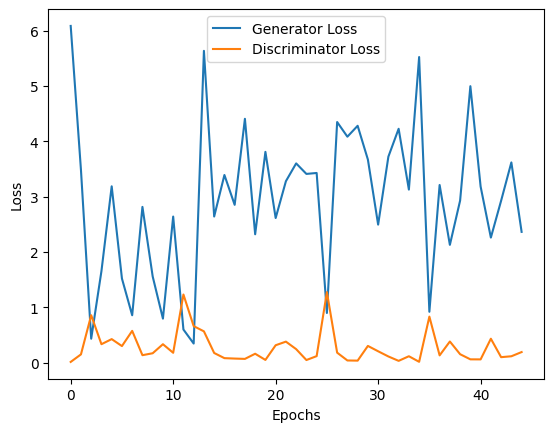

In [15]:
def plot_loss(gen_loss, disc_loss):
    plt.plot(gen_loss, label='Generator Loss')
    plt.plot(disc_loss, label='Discriminator Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()
gen_losses=np.load('gen_losses.npy')
discrim_losses=np.load('discr_losses.npy')
plot_loss(gen_losses,discrim_losses)

Loss per epoch

In [16]:
gen_losses=np.load('gen_losses.npy')
discrim_losses=np.load('discr_losses.npy')

In [17]:
discrim_losses

array([0.01211259, 0.14816511, 0.85660255, 0.33262038, 0.42458585,
       0.29873383, 0.57363307, 0.13390027, 0.16895099, 0.33220446,
       0.17740062, 1.23122418, 0.65941715, 0.56499124, 0.1737611 ,
       0.08032729, 0.072853  , 0.06691887, 0.16000667, 0.04824011,
       0.3137123 , 0.37903729, 0.24335539, 0.04625456, 0.11688519,
       1.27402472, 0.17963596, 0.03834654, 0.03540502, 0.30129105,
       0.20464635, 0.11078379, 0.03131371, 0.11486219, 0.01394925,
       0.83141202, 0.13053636, 0.38129464, 0.1514847 , 0.0587792 ,
       0.05783118, 0.43154588, 0.09807871, 0.11432885, 0.19031356])

In [18]:
gen_losses

array([6.08836269, 3.48702788, 0.43194759, 1.65449023, 3.18774962,
       1.52026999, 0.8558718 , 2.81573296, 1.55793321, 0.79531848,
       2.64085245, 0.59812075, 0.34452501, 5.63768435, 2.64190006,
       3.39250731, 2.85271859, 4.40876484, 2.32044458, 3.81085634,
       2.6141963 , 3.28025246, 3.60235786, 3.41198301, 3.42914581,
       0.89703071, 4.3502841 , 4.08515406, 4.28240204, 3.67197514,
       2.49540782, 3.72409296, 4.22826004, 3.12869215, 5.52564001,
       0.91883594, 3.21159434, 2.12892604, 2.93025684, 4.99861336,
       3.18368673, 2.26074457, 2.9271245 , 3.62006855, 2.36393809])

In [19]:
#Calculate average loss for every episode from steps, perviously array was full of losses per step and not ep
# def loss_per_epoch(arr_loss):
#     loss_arr=[]
#     counter=0
#     average=0
#     for i in range(17595):
#         # print(counter)
#         if counter%391==0 and counter!=0:
#             counter=0
#             average+=arr_loss[i]
#             loss_arr.append(average/391)
#             average=0
#         average+=arr_loss[i]
#         counter+=1
#     return loss_arr
# gen_loss=loss_per_epoch(gen_losses)
# discri_loss=loss_per_epoch(discrim_losses)

# def plot_loss(gen_loss, disc_loss):
#     plt.plot(gen_loss, label='Generator Loss')
#     plt.plot(disc_loss, label='Discriminator Loss')
#     plt.xlabel('Steps')
#     plt.ylabel('Loss')
#     plt.legend()
#     plt.show()

# plot_loss(gen_loss,discri_loss)

In [49]:
trained_gen = Generator(100,3,64).to(device)
#100 img

trained_gen.load_state_dict(T.load('best.pt'))


<All keys matched successfully>

<h2>Generated Images

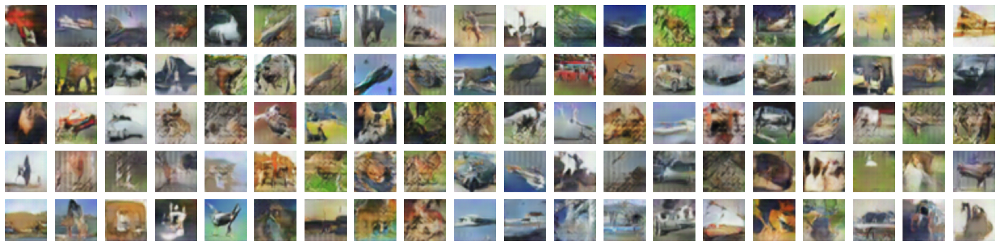

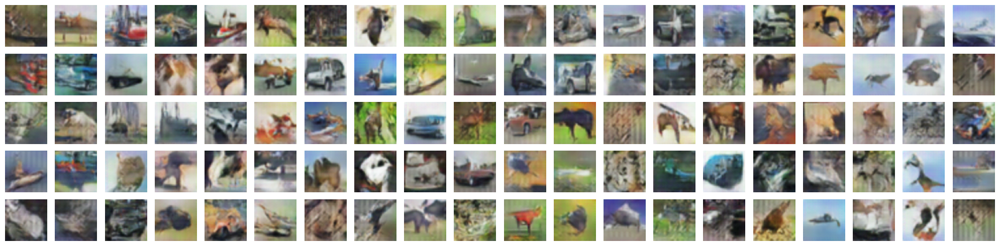

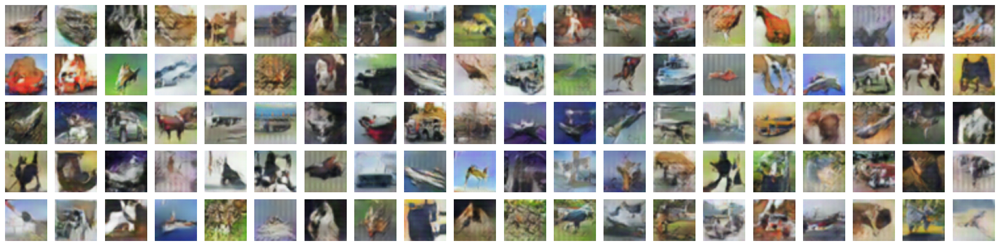

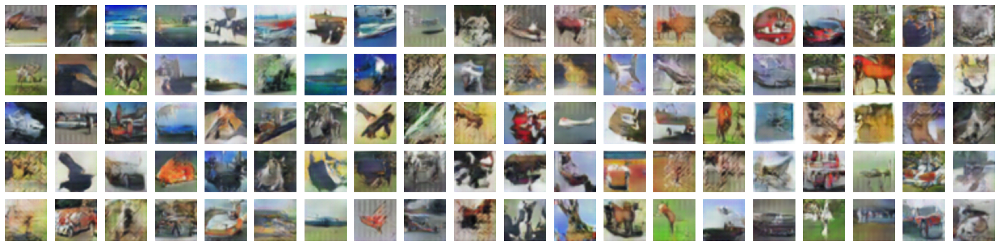

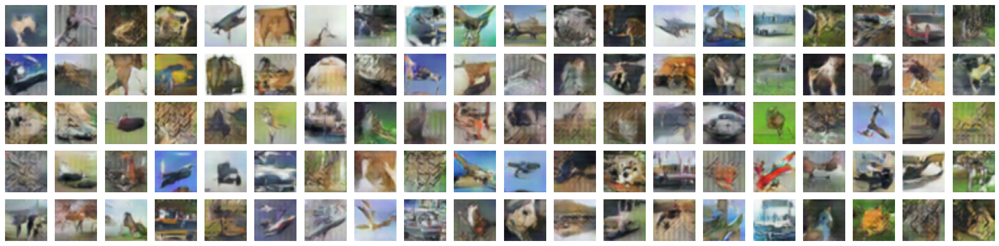

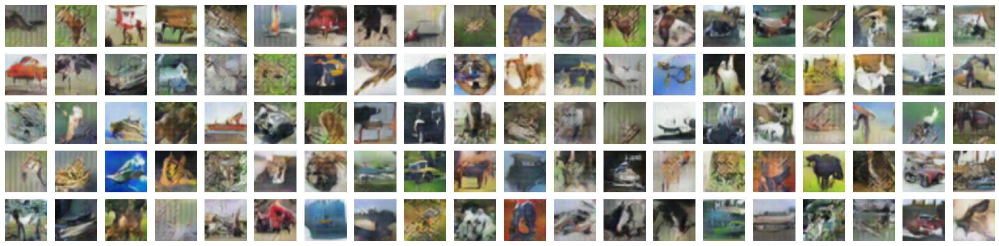

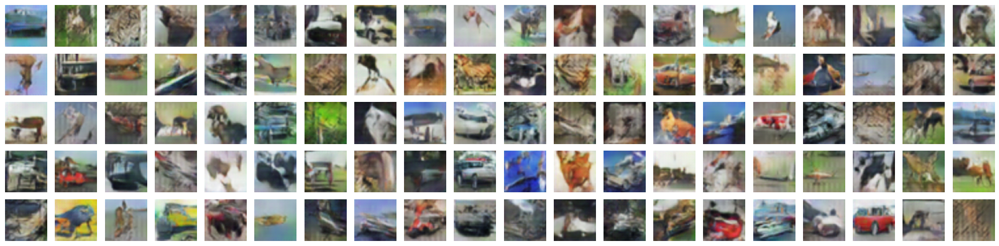

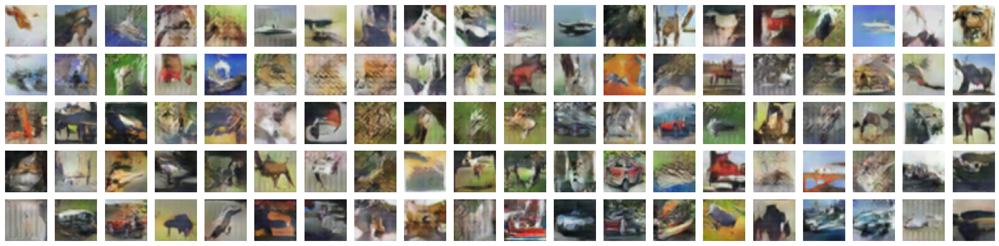

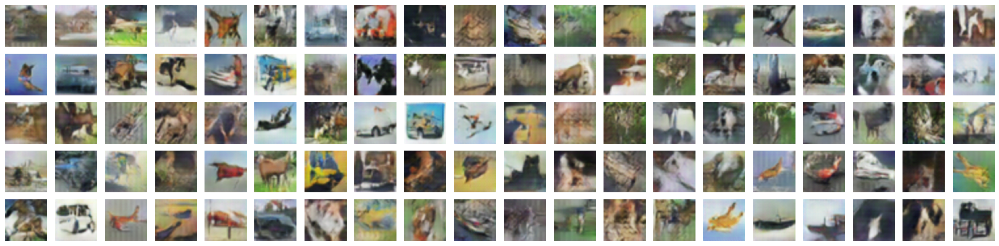

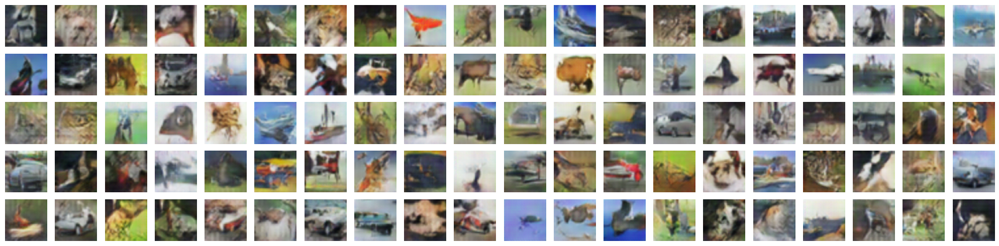

In [50]:
trained_gen.eval()
for _ in range(10):
    input=T.randn(128,100,1,1).to(device)
    input=trained_gen(input).detach().cpu().numpy()
    input = input.transpose(0, 2, 3, 1)
    #tensor format 128,100,1,1 to 128,1,1,100, matplotlib format is (batch size, height, width, channels)
    input = (input + 1) / 2#rescaled from 0,1 to normal pixel range

    fig, axes=plt.subplots(5, 20, figsize=(20,5))
    for i in range(5):
        for j in range(20):
            axes[i][j].imshow(input[i*20+j])
            axes[i][j].axis('off')
    plt.tight_layout()
    plt.show()

<h2>Evaluation

FID Inception score

Generate a large number of images using the generator.

Pass these images through an Inception network (or a pre-trained image classification network), and obtain the predicted class probabilities for each image.

Calculate the KL-divergence between the predicted class probabilities for each image and the average of the predicted class probabilities for all images.

Calculate the exponential of the average of the KL-divergences over all images, which is the IS for the generator.

Inception Score function by sbarratt

https://github.com/sbarratt/inception-score-pytorch/blob/master/inception_score.py

In [52]:
from torchvision.models.inception import inception_v3
from torch.autograd import Variable
from scipy.stats import entropy
def inception_score(imgs, cuda=False, batch_size=32, resize=False, splits=1):
    # imgs -- Torch dataset of (3xHxW) numpy images normalized in the range [-1, 1]
    # cuda -- whether or not to run on GPU
    # batch_size -- batch size for feeding into Inception v3
    # splits -- number of splits
    N = len(imgs)

    transform=transforms.Compose(
    [
        #64 allows the model to learn more complex features and patterns from the data instead of 32
        transforms.Resize((299,299))
    ]
)
    imgs=[transform(img) for img in imgs]
    if cuda:
        dtype = T.cuda.FloatTensor
    else:
        if T.cuda.is_available():
            print("WARNING: You have a CUDA device, so you should probably set cuda=True")
        dtype = T.FloatTensor
    dataloader = DataLoader(imgs, batch_size=batch_size)
    inception_model = inception_v3(pretrained=True, transform_input=False)
    inception_model.eval()
    #model only allows size 299,299
    up = nn.Upsample(size=(299, 299), mode='bilinear').type(dtype)
    def get_pred(x):
        if resize:
            x = up(x)
        x = inception_model(x)
        return F.softmax(x).data.cpu().numpy()
    # Get predictions
    preds = np.zeros((N, 1000))

    for i, batch in enumerate(dataloader, 0):
        batch = batch.type(dtype)
        batchv = Variable(batch)
        batch_size_i = batch.size()[0]

        preds[i*batch_size:i*batch_size + batch_size_i] = get_pred(batchv)
    
     # compute mean kl-div
    split_scores = []

    for k in range(splits):
        part = preds[k * (N // splits): (k+1) * (N // splits), :]
        py = np.mean(part, axis=0)
        scores = []
        for i in range(part.shape[0]):
            pyx = part[i, :]
            scores.append(entropy(pyx, py))
        split_scores.append(np.exp(np.mean(scores)))

    return np.mean(split_scores)

In [57]:
trained_gen = Generator(100,3,64).to(device)
# trained_gen = Generator(100,3,128).to(device)
#100 img

trained_gen.load_state_dict(T.load('best.pt',map_location=T.device('cpu')))
trained_gen.eval()

input=T.randn(128,100,1,1).to(device)
input=trained_gen(input)

inception_score(input)

C:\Users\N8VAN\AppData\Local\Temp\ipykernel_4608\23903142.py:33: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(x).data.cpu().numpy()


3.722085511338662

In [30]:
transform=transforms.Compose(
    [
        transforms.Resize((299,299)),
        transforms.ToTensor(),
        transforms.Normalize((0.5,0.5,0.5),(0.5,0.5,0.5)) 
    ]
)
dataset=datasets.CIFAR10(root="dataset/",train=False,transform=transform,download=True)
#lodding dataset easily iterate over data in batches, which is more memory efficient and faster than loading entire thing at once.
dataloader=DataLoader(dataset,batch_size=128,shuffle=True,num_workers=2)

Files already downloaded and verified


FrechetInceptionDistance

https://torchmetrics.readthedocs.io/en/stable/image/frechet_inception_distance.html

In [48]:
from torchmetrics.image.fid import FrechetInceptionDistance
# fid expects torch.Tensor with dtype=torch.uint8
fid = FrechetInceptionDistance(feature=64)
trained_gen = Generator(100,3,64).to(device)
trained_gen.load_state_dict(T.load('batch128.pt',map_location=T.device('cpu')))
trained_gen.eval()

for batch ,(real,_) in enumerate(dataloader): #get fake and real images same amount
    real=real.to(device)
    noise=T.randn(128,100,1,1).to(device) #fake real
    fake_img=trained_gen(noise)
    break

fake_img = (fake_img + 1) / 2 * 255
fake_img = fake_img.to(T.float32)
fake_img = F.interpolate(fake_img, size=299, mode='bilinear', align_corners=False)
fake_img = (fake_img / 255 * 2 - 1).to(T.uint8)

real = (real + 1) / 2 * 255
real = real.to(T.uint8)
fid.update(fake_img.detach().cpu(),real=False) #transfer your tensors to CPU
fid.update(real.detach().cpu(),real=True)

fid.compute()

tensor(54.6805)

In [45]:
fake_img.size()

torch.Size([128, 3, 299, 299])

In [46]:
real.size()

torch.Size([128, 3, 299, 299])